# TP3 : MDI720

In [157]:
#Imports
%matplotlib inline
import math                         
import numpy as np                  
from sklearn import linear_model as lm    
import pandas as pd
import matplotlib.pyplot as plt     
import seaborn as sns               
import sys
from statistics import mean
import numpy.linalg as linalg
import statsmodels.api as sm
from sklearn import preprocessing
from random import *
from sklearn.model_selection import train_test_split
from scipy import stats

##### *(Q1)* 
Importer la base de données data_dm3.csv disponible depuis le lien https://bitbucket.org/
portierf/shared_files/downloads/data_dm3.csv. La dernière colonne est la variable à expliquer.
Les autres colonnes sont les variables explicatives. Préciser le nombre de variables explicatives
et le nombre d’observations.

In [158]:
#Charger le set de données
df = pd.read_csv('https://bitbucket.org/portierf/shared_files/downloads/data_dm3.csv', ',', header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,201,202,203,204,205,206,207,208,209,210
0,-1.298173,-0.162249,1.223379,1.355554,1.080171,0.634979,0.298741,0.548270,0.731773,1.018645,...,0.588278,0.210106,1.861458,-0.436399,0.279299,-1.416020,-2.332363,0.215096,-0.693319,151.0
1,0.166951,-0.338060,-0.618867,0.759366,1.134281,-0.536844,-0.075120,0.970251,-0.327487,0.717310,...,-0.251054,-0.825716,0.339139,1.119430,0.225958,-0.822288,0.382838,-0.718829,-0.188993,75.0
2,-0.416177,-0.205659,-1.282226,1.675500,1.523746,0.192029,-0.235840,-1.954626,-0.853309,0.892791,...,1.283837,0.372516,-0.652557,-2.579347,0.139267,-1.901196,0.048210,0.220205,0.471588,141.0
3,0.867184,-0.398667,0.093501,0.025971,1.852099,0.789774,0.801775,0.376711,0.853689,0.247953,...,0.446582,0.334733,0.399074,-0.884172,0.723819,1.316367,0.088218,0.619496,1.061662,206.0
4,1.193282,-0.936980,-0.725039,0.766078,0.223489,-1.584622,1.146866,0.086136,-0.088780,-0.945066,...,0.786157,-1.058179,-0.155788,-0.642504,2.040010,-1.703110,-1.901502,1.778811,-0.489853,135.0


In [159]:
#Séparer les données en features(X) et label(y)
y = pd.DataFrame(df.iloc[:,-1])
X = pd.DataFrame(df.iloc[:,:-1])
print("Le nombre d'observations est : " + str(len(df)))
print("Le nombre de variables explicatives est : " + str(len(X.columns)))

Le nombre d'observations est : 442
Le nombre de variables explicatives est : 210


##### *(Q2)* 
Les variables explicatives sont-elles centrées ? Normalisées ? Qu’en est-il de la variable à expliquer ?
Tracer un scatter plot de la base de données avec 4 covariables prises au hasard et la variable à
expliquer (un scatterplot regroupe les graphes de chacune des variables en fonction de chacune des
autres). Commenter les graphiques obtenus.

In [161]:
#Vérifier la variance et la moyenne des variables explicatives
X.describe()

,0,1,2,3,4,5,6,7,8,9,...,200,201,202,203,204,205,206,207,208,209
count,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,...,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02,4.420000e+02
mean,7.535450e-19,-1.507090e-17,5.494599e-20,-7.284269e-18,8.288995e-18,-2.712762e-17,1.971776e-17,8.540177e-18,1.029845e-17,4.018907e-18,...,1.934099e-17,-2.260635e-18,-2.637408e-17,-5.023634e-19,-1.538488e-17,5.525997e-18,3.265362e-17,1.507090e-17,-4.034606e-18,1.205672e-17
std,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,...,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00,1.001133e+00
min,-3.149247e+00,-2.862871e+00,-3.057543e+00,-2.856903e+00,-3.102347e+00,-2.782344e+00,-2.825318e+00,-3.626525e+00,-2.834007e+00,-2.695861e+00,...,-3.436711e+00,-3.059475e+00,-3.206539e+00,-2.585325e+00,-3.561763e+00,-3.167962e+00,-2.751207e+00,-3.028940e+00,-2.675447e+00,-2.918321e+00
25%,-6.707870e-01,-7.128394e-01,-7.160981e-01,-6.715474e-01,-6.732232e-01,-6.951004e-01,-6.986587e-01,-6.387691e-01,-6.666746e-01,-6.930021e-01,...,-6.602634e-01,-6.885118e-01,-5.793321e-01,-6.282190e-01,-6.190946e-01,-7.359866e-01,-6.374872e-01,-6.472739e-01,-7.025578e-01,-6.378171e-01
50%,3.819503e-02,6.217421e-02,4.739406e-02,6.565749e-05,-6.111315e-03,-1.345167e-02,-4.823057e-02,4.016636e-02,6.047571e-04,3.602406e-02,...,4.227517e-02,-2.994795e-02,2.540540e-02,-2.229024e-02,-6.087758e-03,7.677091e-03,-3.123603e-03,2.444578e-02,-4.187834e-02,-8.099075e-02
75%,6.748497e-01,6.244547e-01,6.975121e-01,6.881971e-01,7.026457e-01,7.155790e-01,7.200217e-01,5.788436e-01,6.298078e-01,6.629150e-01,...,6.433939e-01,6.672697e-01,6.676636e-01,5.985077e-01,7.406183e-01,7.000447e-01,6.440062e-01,6.313916e-01,6.929876e-01,7.249269e-01
max,2.547051e+00,2.567177e+00,2.965824e+00,3.057612e+00,3.173713e+00,3.137950e+00,3.199205e+00,3.616718e+00,3.099090e+00,3.032505e+00,...,2.737036e+00,2.677458e+00,2.806877e+00,3.255462e+00,2.811911e+00,2.838960e+00,3.351254e+00,2.734481e+00,3.637684e+00,2.710260e+00


In [162]:
def test_centre_normalise(df) :
    centre_norm = 0
    non =0
    i = 0
    while i < len(df.columns) :
        if np.isclose(df[i][1], 0) and np.isclose(df[i][2],1, rtol = 0.01) :
            centre_norm += 1
        else : non += 1
        i += 1
    print("Nombre de variables centrées et normalisées : "+ str(centre_norm))
    print("Nombre de variables ni centrées ni normalisées : "+ str(non))

In [163]:
test_centre_normalise(X.describe())

Nombre de variables centrées et normalisées : 210
Nombre de variables ni centrées ni normalisées : 0


Les variables sont centrées et normalisées. On sélectionne 4 variables au hasard :

In [164]:
#Ajouter à une liste 4 variables au hasard
liste = []
for i in range(len(X.columns)):
    liste.append( randint(0, len(X.columns)))
random = sample(liste, 4)

#Afficher les variables choisies
print(random)

#On concatène les résultats
concat = pd.concat([X[random[0]], X[random[1]], X[random[2]], X[random[3]], y], axis=1)

[118, 48, 0, 40]


/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


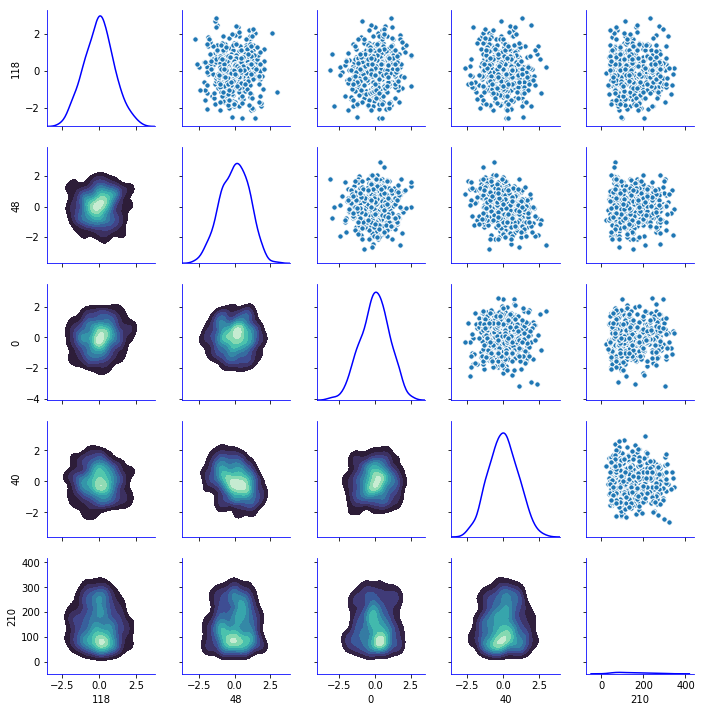

In [165]:
fig1 = sns.PairGrid(concat, height=2).map_diag(sns.kdeplot, color='Blue', legend=False).map_upper(plt.scatter, edgecolor="w", s=30).map_lower(sns.kdeplot, shade=True,shade_lowest=False, cmap="mako", legend=False)
display(fig1)

Le graphique nous indique que :
- la distribution normale ne semble pas loin de la réalité pour l'histogramme de chaque variable
- il ne semble pas y avoir de correlation apparente entre les variables sélectionnées aléatoirement et la variable explicative
- les variables explicatives ne semblent pas correlées entre elles
- selon le nombre aléatoire sélectionnée, il se peut que la distribution indique une correlation existante entre la variable explicative et notre y.

##### *(Q3)* 
Echantillon d’apprentissage et de test. Créer 2 échantillons : un pour apprendre le modèle Xtrain,
un pour tester le modèle Xtest. On mettra 20% de la base dans l’échantillon ’test’. Donner les tailles
de chacun des 2 échantillons. On notera que le nouvel échantillon de covariables Xtrain n’est pas
normalisé. Dans la suite, on fera donc bien attention à inclure l’intercept dans nos régression.

In [166]:
#Train Test Split de notre échantillon
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
print(X_train.shape)

(353, 210)


In [167]:
print(X_test.shape)

(89, 210)


In [168]:
print(y_train.shape)

(353, 1)


In [169]:
print(y_test.shape)

(89, 1)


##### *(Q4)*
Donner la matrice de covariance calculée sur Xtrain. Tracer le graphe de la décroissance des valeurs
propres de la matrice de covariance. Expliquer pourquoi il est légitime de ne garder que les premières
variables de l’ACP. On gardera 60 variables dans la suite.

In [170]:
#Créer un background pour afficher la matrice des corrélations.
X_train.cov().style.background_gradient

<bound method Styler.background_gradient of <pandas.io.formats.style.Styler object at 0x1c1af9c278>>

In [171]:
def magnify():
    return [dict(selector="th",
                 props=[("font-size", "4pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

X_train.cov().style.background_gradient(cmap='Blues', axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '1pt'})\
    .set_caption("Hover to magnify")\
    .set_precision(2)\
    .set_table_styles(magnify())

A cette échelle, la covariance apparaît assez hétérogène. On sent dès lors que certaines variables ne sont pas forcement reliées à Y, tandis que d'autres sont corrélées entre elles et apportent de l'information dans l'explication de Y.

In [172]:
#Compute the eigenvalues 
eigenValues = np.linalg.eigh(X_train.cov(), UPLO='L')[0]

Text(0.5, 1.0, 'Décroissance des valeurs propres de la matrice de covariance')

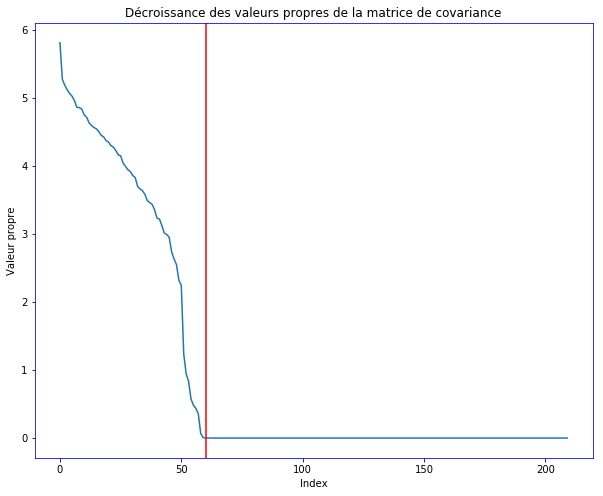

In [173]:
fig2 = plt.figure(figsize=(10,8))
plt.plot(sorted(eigenValues, reverse=True))
plt.axvline(x=60,color='red')
plt.xlabel("Index")
plt.ylabel("Valeur propre")
plt.title("Décroissance des valeurs propres de la matrice de covariance")

En traçant une ligne verticale à x = 60, on se rend bien compte que l'on sélectionne uniquement les valeurs propres situées avant le coude. Cela nous permet d'éliminer les variables qui ont peu d'impact sur la matrice de covariance. Ces variables peuvent être corrélées linéairement, créent des valeurs propres proches de 0, et compremettent l'inversibilité de la matrice de Gram entre autre.

##### *(Q5)*
Suivant les observations de la question (Q4), appliquer la méthode de "PCA before OLS" qui
consiste à appliquer OLS avec Y et Xtrain * V1:60, où V1:60 contient les vecteurs propres (associés
aux 60 plus grandes valeurs propres) de la matrice de covariance. Faire une régression linéaire (avec
intercept), puis tracer les valeurs des coefficients (hors intercept). Sur un autre graphique, faire de
même avec la méthode des moindres carrés classique.

In [176]:
#Analyse en composants principale (ACP)
from sklearn.decomposition import PCA
import sklearn.linear_model as lm

#ACP avec 60 dimensions
pca = PCA(n_components = 60)

#Fit des échantillons Train et Test au PCA
X_pca_train = pca.fit_transform(X_train)
X_pca_test = pca.transform(X_test)

model_pca = lm.LinearRegression(fit_intercept = True).fit(X_pca_train,y_train)

model_pca.fit(X_pca_train,y_train)

#Intercept et coefficient
intercept_pca = model_pca.intercept_
coeffs_pca = model_pca.coef_

print("L'intercept dans le modèle avec PCA est : " + str(float(intercept_pca)))

L'intercept dans le modèle avec PCA est : 151.3682719546742


L'intercept dans le modèle sans PCA est : 150.7120219546742


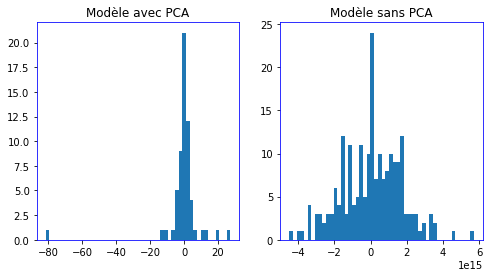

In [177]:
#Modèle OLS
model = lm.LinearRegression(fit_intercept = True)
model.fit(X_train,y_train)

#Intercept et coefficients
intercept = model.intercept_
coeffs = model.coef_

print("L'intercept dans le modèle sans PCA est : " + str(intercept[0]))

fig3 = plt.figure(figsize=(8,4))
plt.subplot(1, 2, 1)
plt.hist(np.squeeze(coeffs_pca), bins=50)
plt.title('Modèle avec PCA')

plt.subplot(1, 2, 2)
plt.hist(np.squeeze(coeffs), bins=50)
plt.title('Modèle sans PCA')

plt.show()

##### *(Q6)*
Donner les valeurs des intercepts pour les 2 régressions précédentes. Donner la valeur moyenne de
la variable Y (sur le train set). Les intercepts des 2 questions sont-ils égaux ? Commenter. Uniquement pour cette question, centrer et réduire les variables après ACP (de petite dimension). Faire une régression avec ces variables et vérifier que l’intercept est bien égal à la moyenne de Y sur le Train.

In [178]:
#Intercept avec et sans PCA
print("Intercept sans PCA : " + str(round(float(intercept),4)))
print("Intercept avec PCA : " + str(round(float(intercept_pca),4)))

Intercept sans PCA : 150.712
Intercept avec PCA : 151.3683


In [179]:
#Prediction des deux modèles
ypred_pca = np.mean(model_pca.predict(X_pca_train))
print("Prediction moyenne dans le modèle avec PCA : " + str(round(ypred_pca,4)))
ypred = np.mean(model.predict(X_train))
print("Prediction moyenne dans le modèle sans PCA : " + str(round(ypred,4)))

Prediction moyenne dans le modèle avec PCA : 151.3683
Prediction moyenne dans le modèle sans PCA : 151.455


Les deux intercept sont très proches mais restent différents. Cela s'explique notamment par le faire que l'ACP permet de réduire la dimension du problème.

In [180]:
#Centrer et reduire les données et appliquer une regression
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

#Appliquer StandarsScaler aux données
X_pca_train_center = scaler.fit_transform(X_pca_train)

In [181]:
#Afficher l'intercept et la moyenne
model_pca = lm.LinearRegression(fit_intercept = True).fit(X_pca_train_center,y_train)

model_pca.fit(X_pca_train_center,y_train)

intercept_pca = model_pca.intercept_
coeffs_pca = model_pca.coef_
ypred_pca = np.mean(model_pca.predict(X_pca_train_center))

#Vérifier que les deux éléments sont égaux :
print(float(intercept_pca))
print(ypred_pca)

#Les deux variables sont-elles similaires?
np.isclose(ypred_pca, float(intercept_pca))

151.3682719546742
151.3682719546742


True

Les deux variables sont similaires ce qui conforte les résultats de notre ACP.

##### *(Q7)* 
Pour les 2 méthodes (OLS et PCA before OLS) : Tracer les résidus de la prédiction sur l’échantillon
test. Tracer leur densité (on pourra par exemple utiliser un histogramme). Calculer le coefficient de
détermination sur l’échantillon test. Calculer le risque de prédiction sur l’échantillon test.

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


Text(0.5, 0.98, 'Densité des résidus selon le modèle')

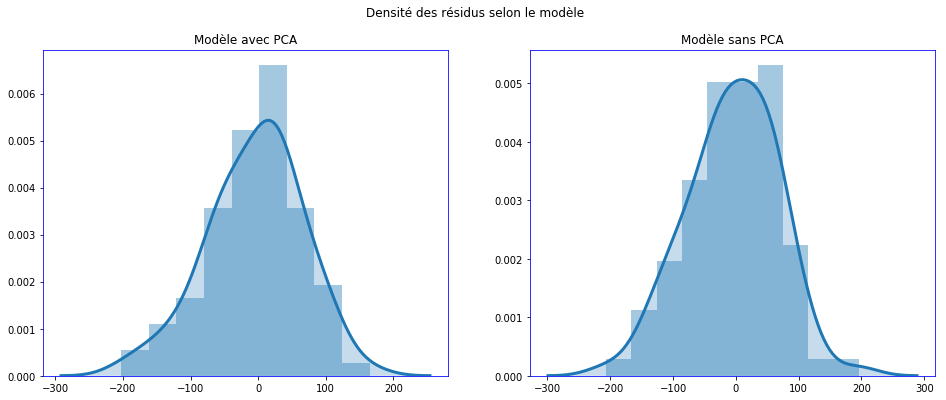

In [194]:
#Résidu des deux modèles
residu_pca = model_pca.predict(X_pca_test) - y_test
residu = model.predict(X_test) - y_test

fig4 = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
sns.distplot(residu_pca, hist = True, kde = True, kde_kws = {'shade': True, 'linewidth': 3})
plt.title('Modèle avec PCA')

fig5 = plt.subplot(1, 2, 2)
sns.distplot(residu, hist = True, kde = True, kde_kws = {'shade': True, 'linewidth': 3})
plt.title('Modèle sans PCA')
plt.suptitle('Densité des résidus selon le modèle')

In [195]:
from sklearn.metrics import r2_score
r2_pca = r2_score(y_test, model_pca.predict(X_pca_test))
r2 = r2_score(y_test, model.predict(X_test))

score_pca = model_pca.score(X_pca_test, y_test)

print("Le R2 dans notre modèle avec PCA Before OLS est : " + str(r2_pca))
print("Le R2 dans notre modèle avec OLS est : " + str(r2))

Le R2 dans notre modèle avec PCA Before OLS est : 0.09688096001725455
Le R2 dans notre modèle avec OLS est : 0.0783676211886094


In [196]:
#Risques de prediction
y_pred_pca = model_pca.predict(X_pca_test)
y_pred = model.predict(X_test)

#Risque PCA before OLS
pred_risk_pca = float(np.mean((y_pred_pca-y_test)**2))
print("Prediction risk of the PCA before OLS Model : " + str(pred_risk_pca))

#Risque OLS
pred_risk_ols = float(np.mean((y_pred-y_test)**2))
print("Prediction risk of the OLS Model : " + str(pred_risk_ols))

Prediction risk of the PCA before OLS Model : 5001.944812714854
Prediction risk of the OLS Model : 5104.481350004277


- ##### *(Q8)* 
Appliquer la méthode de forward variable sélection. On pourra utiliser la statistique du test de
nullité du coefficient (comme vu en cours). Pour l’instant, on ne met pas de critère d’arret sur la
méthode. C’est à dire que l’on ajoute une variable à chaque étape jusqu’à retrouver la totalité des
variables. Afficher l’ordre de séléction des variables.

- ##### *(Q9)* 
Critère d’arrêt : On décide d’arrêter lorsque la p-valeur dépasse 0.1. Illustrer la méthode en donnant
(i) les 3 graphes des statistiques obtenues lors de la sélection de la 1er, 2eme et 3eme variables (en
abscisse : l’index des variables, en ordonné : la valeur des stats) , (ii) le graphe des 50 premières
p-valeurs (dont chacune est associée à la variable sélectionnée). Sur ce même graphe, on tracera la
ligne horizontale d’ordonnée 0.1. Enfin on donnera la liste des variables sélectionnées.

In [197]:
def forward_selection(X_train, y_train, seuil_p_value, nb_to_plot) :
    import scipy.stats as stat
    features_list = list(range(0,len(X_train.columns)))
    global features_selected
    features_selected = {}
    p_values_selected = {}
    
    #Seuil Random
    t_stat_max = 0

    j = 0
    global t_stat_trace
    t_stat_trace = []
    stop_index = []
    
    while len(features_list) > 0:
        #Number of observations, t_stat and residual
        obs = len(y_train)
        t_stat = []
        res = []
        
             
        #Pour chaque feature dans la liste
        for i in features_list:
            
            #Regression linéaire de la colonne sur notre Y
            model = lm.LinearRegression(fit_intercept = True)
            model.fit(X_train[[i]], y_train)
            
            #Prediction du modèle
            y_pred = model.predict(X_train[[i]])
            
            #Variance des résidus et variance du coefficient
            sigma_res = ((y_train - y_pred)**2).sum()/(obs-2)
            sigma_coef = np.sqrt(sigma_res / ((X_train[i] - X_train[i].mean())**2).sum())
            
            #Calculer la stat de test
            statistique = float(abs(model.coef_[0][0]/sigma_coef))
            
            #Rajouter le residu et la stat de test correspondante
            res.append(y_train - y_pred)
            t_stat.append(statistique)
            t_stat_trace.append(statistique)    
                
        #Récupérer l'indice correspondant au max de la stat de test, et la valeur correspondante
        t_stat_max = max(t_stat)
        ind_max = t_stat.index(t_stat_max)
        p_value_max = (1 - stat.t.cdf(abs(t_stat_max), obs - 2)) * 2
        
        #Si p-value > seuil, on s'arrête
        #print(break_point)
        if p_value_max > seuil_p_value:
           # break
            stop_index.append(j)
            
        j = j+1
            
        #Pour constuire le graph des p-valeurs
        p_values_selected[features_list[ind_max]] = p_value_max
        
        #Rajouter la valeur de la stat de test maximale et l'indice correspondant
        features_selected[features_list[ind_max]] = t_stat_max
        
        #On update Y avec les résidus de la regression précédente
        y_train =  res[ind_max]
        
        #Supprimer la colonne qui a été ajoutée à features_selected    
        del features_list[ind_max]
    
    lists = sorted(p_values_selected.items()) #Ordonné par clé, retourne une liste de tuples
    x, y = zip(*lists) #Extrait les valeurs de la liste de tuples

    #lists3 = sorted(t_stat_3.items()) #Ordonné par clé, retourne une liste de tuples
    #x3, y3 = zip(*lists3) #Extrait les valeurs de la liste de tuples
    
    print("Liste des variables selectionnées et des T-Test correspondants : ")
    print({k: features_selected[k] for k in list(features_selected)[:min(stop_index)]})

    fig7 = plt.figure(figsize=(10,8))
    plt.plot(sorted(y[:nb_to_plot]))
    plt.axhline(y=0.1, color='r', linestyle='-')

Liste des variables selectionnées et des T-Test correspondants : 
{58: 13.20612445116209, 123: 7.35237743353015, 112: 2.4476038128596866, 13: 2.494154209049431, 208: 2.3151422376566413, 77: 2.3683581786457335, 183: 1.9813913740128406, 124: 1.9238062714482107, 167: 1.8514115218605394, 133: 2.220223659198731, 135: 1.8093197974697945, 34: 2.019361498439411}


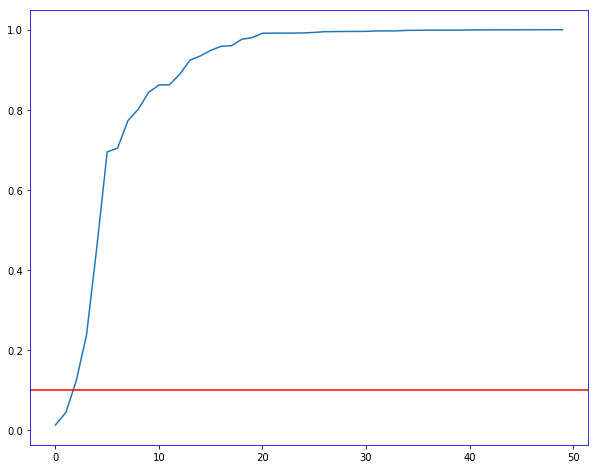

In [198]:
forward_selection(X_train, y_train, 0.1, 50);

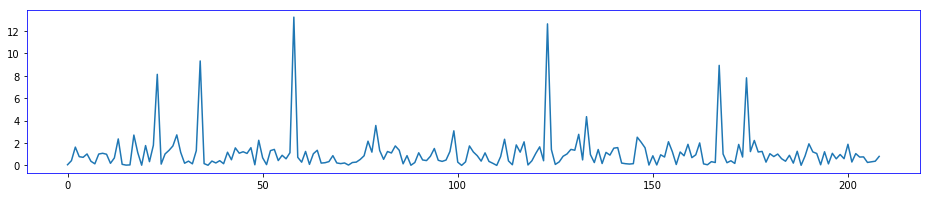

In [203]:
#T-Stat pour la première variable
fig = plt.figure(figsize = (16,3))
plt.plot(t_stat_trace[0:len(X.columns)-1])

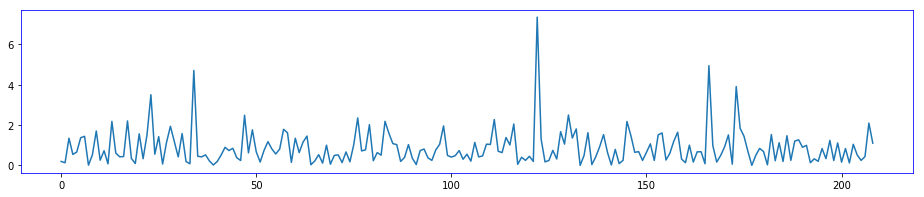

In [204]:
#T-Stat pour la deuxième variable
fig = plt.figure(figsize = (16,3))
plt.plot(t_stat_trace[len(X.columns):2*len(X.columns)-1])

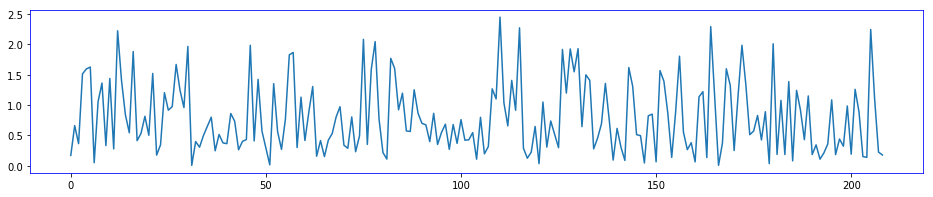

In [205]:
#T-Stat pour la troisième variable
fig = plt.figure(figsize = (16,3))
plt.plot(t_stat_trace[2*len(X.columns):3*len(X.columns)-1])

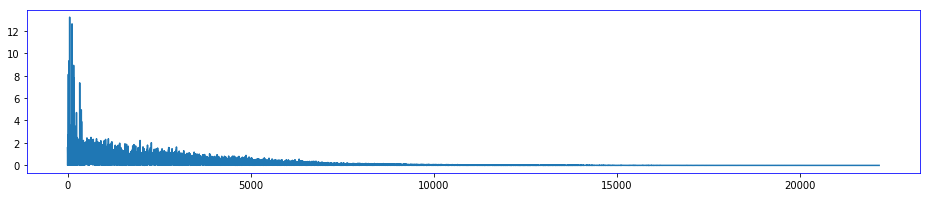

In [206]:
#Toutes les T-Stats
fig = plt.figure(figsize = (16,3))
plt.plot(t_stat_trace)

##### *(Q10)*
Appliquer OLS sur les variables sélectionnées. Donner le risque de prédiction obtenu l’échantillon
test et le comparer à ceux de OLS et PCA before OLS.

In [207]:
X_selected_train = X_train[list(features_selected)]
X_selected_test = X_test[list(features_selected)]
#Regression linéaire
model_sel = lm.LinearRegression(fit_intercept = True)
model_sel.fit(X_selected_train, y_train)
            
#Prediction du modèle
y_pred = model_sel.predict(X_selected_test)
pred_risk = float(np.mean((y_pred-y_test)**2))
#print(pred_risk.sum)
print("Le risque de prediction associé est : " + str(pred_risk))

Le risque de prediction associé est : 17126.1646464742


Le risque de prédiction est inférieur au risque obtenu précedemment.

##### *(Q11)* 
Afin de préparer la validation croisée, séparer l’échantillon train en 4 parties (appelées ”folds”) de
façon aléatoire. On affichera les numéros d’échantillon sélectionnés dans chaque fold.

In [208]:
from sklearn.model_selection import KFold

kf = KFold(n_splits=4)
kf.get_n_splits(X_selected_train)

kf = kf.split(X_selected_train)
i = 1

for train_index, test_index in kf :
    print("############### Fold " + str(i) + " ###############")
    print("Dans le fold " + str(i) + " sont contenus les index : ")
    print("Index des colonnes servant au Train : " + str(train_index))
    print("Index des colonnes servant au Test : " + str(test_index))
    print(" ")
    i = i+1

#for train_index, test_index in kf.split(X_selected_train):
   # print("TRAIN:", train_index, "TEST:", test_index)
   # X_train_CV, X_test_CV = X_selected_train[train_index], X_selected_train[test_index]
   # y_train_CV, y_test_CV = y_train[train_index], y_train[test_index]

############### Fold 1 ###############
Dans le fold 1 sont contenus les index : 
Index des colonnes servant au Train : [ 89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214
 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232
 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250
 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268
 269 270 271 272 273 274 275 276 277 278 279 280 281 282 283 284 285 286
 287 288 289 290 291 292 293 294 295 296 297 298 299 300 301 302 303 304
 305 

##### *(Q12)* 
Appliquer la méthode de la régression ridge. Pour le choix du paramètre de régularisation, on fera
une validation croisée sur les ”folds” définies lors de la question précédente. A tour de rôle chacune
des ”folds” servira pour calculer le risque de prédiction alors que les autres seront utilisées pour
estimer le modèle. On moyennera ensuite les 4 risques de prédictions. On donnera la courbe du
risque de validation croisée en fonction du paramètre de régularisation (on veillera à bien choisir
l’espace de définition pour le graphe). Donner le paramètre de régularisation optimal et la valeur
du risque sur le test.

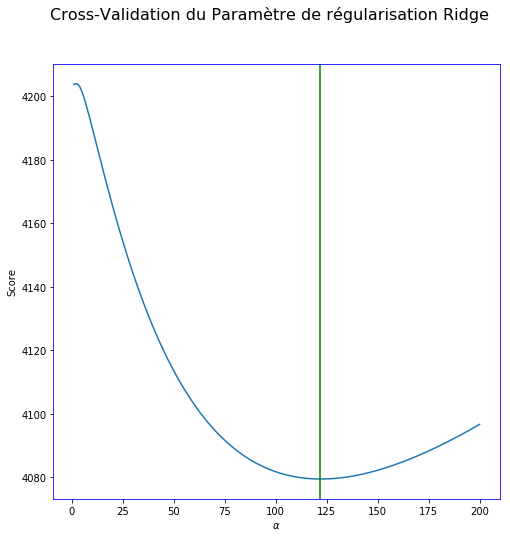

Le paramètre de régularisation RIDGE optimal obtenu par Validation croisée est : 122.0


In [209]:
from sklearn.linear_model import Ridge
import statistics

# Sépare l’échantillon train en 4 folds
kfolds = KFold(n_splits=4, shuffle=True)

# Récupere les index du shuffle
index_train = []
index_test = []
for train, test in kfolds.split(X_selected_train):
    index_train.append(train)
    index_test.append(test)

# Liste des paramètre de régularisation à tester
alphas_list = np.linspace(1, 200, 200)

# Initialization de la liste des risque de prediction de la cross validation
R_pred_cv = []

# Cross Validation pour trouver le paramètre de régularisation optimal
for alpha in alphas_list:

    # Initiliazation de la liste des risque de predictions pour chacun des k-folds
    R_pred = []

    # Regression Ridge sur les 4 folds
    for i in range(0, len(index_train)):

        # Regression Ridge
        ridge = Ridge(alpha=alpha).fit(X_selected_train.iloc[index_train[i]], y_train.iloc[index_train[i]])

        # Calcul de la prediction
        Y_pred = ridge.predict(X_selected_train.iloc[index_test[i]])

        # Calcul du risque de prediction
        R_pred.append(float(((y_train.iloc[index_test[i]] - Y_pred) ** 2).mean()))

    # Calcul du Risque de prediction moyen
    R_pred_cv.append(mean(R_pred))

# Selection le modele avec le risque de prediction le plus faible
ind_min = R_pred_cv.index(min(R_pred_cv))
alpha_opt = alphas_list[ind_min]

# Graphique
fig = plt.figure(figsize=(8, 8))
fig.suptitle('Cross-Validation du Paramètre de régularisation Ridge', fontsize = 16)
plt.plot(alphas_list, R_pred_cv)
#plt.axhline(min(R_pred_cv), color='r', ls='--')
plt.axvline(alpha_opt, color='g',)
plt.xlabel(r'$\alpha$')
plt.ylabel('Score')
plt.show()
# Commentaire
print("Le paramètre de régularisation RIDGE optimal obtenu par Validation croisée est : {}".format(alpha_opt))

##### *(Q13)* 
A l’aide de la fonction lassoCV de sklearn, choisir le paramètre de régularisation du LASSO. Donner
le risque de prédiction associé.

In [216]:
from sklearn.linear_model import Lasso, LassoCV

#Utiliser la validation croisée pour trouver le Alpha optimal
lassocv = LassoCV(alphas=np.linspace(1,1000, 10001), cv=4).fit(X_selected_train, y_train)

#Prediction sur la base du alpha optimal
Y_pred_lasso = lassocv.predict(X_selected_test)

pred_risk_lasso = np.mean((np.array(y_test) - Y_pred_lasso)**2)
print("Alpha optimal = ", lassocv.alpha_)

pd.Series(lassocv.coef_, index=X_selected_train.columns)
coef = lassocv.coef_

print("Risque de prediction : " + str(pred_risk_lasso))

/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:1094: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Alpha optimal =  5.4955
Risque de prediction : 7714.397917470931


##### *(Q14)* 
Donner les variables selectionées par le lasso. Combien y-en a t-il ? Appliquer la méthode OLS aux
variables sélectionnées. Cette méthode est appelé Least-square LASSO.

In [217]:
list_coef = [list(coef).index(element) for element in coef if np.isclose(element, 0.00) == False]
len_coef = len(list_coef)
print("Liste des index des coefficients significatifs : " + str(list_coef))
print("Nombre de coefficients significatifs : " + str(len_coef))

X_selected_train_lasso = X_train[list_coef]

model_lasso_ols = lm.LinearRegression(fit_intercept = True).fit(X_selected_train_lasso,y_train)

intercept_lasso_ols = model_lasso_ols.intercept_
coeffs_lasso_ols = model_lasso_ols.coef_
ypred_lasso_ols = np.mean(model_lasso_ols.predict(X_selected_train_lasso))

#Vérifier que les deux éléments sont égaux :
print("Intercept : " + str(float(intercept_lasso_ols)))
print("Prediction : " + str(ypred_lasso_ols))
pred_risk_lasso_ols = np.mean((np.array(y_test) - ypred_lasso_ols)**2)
print("Risque de prediction : " + str(pred_risk_lasso_ols))

Liste des index des coefficients significatifs : [0, 1, 2, 3, 5, 8, 10, 41, 198, 207]
Nombre de coefficients significatifs : 10
Intercept : 151.44123160936255
Prediction : 151.3682719546742
Risque de prediction : 5552.964188385766


*(Q15)* Cette dernière question est un question d’ouverture vers une approche non-linéaire. En utilisant les
variables séléctionées par le LASSO (Q13) ou par la méthode forward (Q9), mettre au point une
méthode de regression non-linéaire. On apprendra les différents paramètres par validation croisée
et l’on donnera la valeur du risque de prédiction calculé sur l’échantillon test. Des performances
moindres par rapport à OLS peuvent se produire. Commenter.

In [218]:
from sklearn import tree
from sklearn import cross_validation

#Y_pred = cross_validation.cross_val_predict(lr, X_train, np.array(y_train).reshape(353,), cv=4)
#pred_error_lr = np.mean((np.array(y_test) - Y_pred)**2)
#print("Predition error : " + str(pred_error_lr))

depth_tree = {}
for i in range(1,50):
    clf = tree.DecisionTreeClassifier(max_depth=i)
    # Perform 7-fold cross validation
    clf = clf.fit(X_selected_train, y_train)
    y_pred = clf.predict(X_test)
    pred_error = np.mean((np.array(y_test) - y_pred)**2)
    depth_tree[i]=pred_error

items = dict((k,float(v)) for k,v in depth_tree.items()) #Convertir la colonne y en float
#lists = sorted(floats.items()) #Ordonné par clé, retourne une liste de tuples
x, y = zip(*items.items()) #Extrait les valeurs de la liste de tuples
minimum_tree = min(items, key=items.get)
print("Prediction associé à la profondeur : " + str(minimum_tree) + " un risque de prédiction de : " + str(depth_tree[minimum_tree]))

Prediction associé à la profondeur : 6 un risque de prédiction de : 7518.51508647898


In [222]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

kfold = KFold(n_splits=10, random_state=22)

svr = SVR(gamma=0.001)

## Search grid for optimal parameters
svr_param_grid = {"C": [0.5,1.0,1.5],
              "epsilon": [0.1,0.2,0.3]}

svr_gs = GridSearchCV(svr,param_grid = svr_param_grid, cv=kfold)

svr_gs.fit(X_train,y_train)

y_test = column_or_1d(y_test, warn=False)

# Best score
ypred_svr = svr_gs.predict(X_test)
pred_risk_svr = np.mean((y_test - ypred_svr)**2)
print("Risque de prediction : " + str(pred_risk_svr))

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

NameError: name 'column_or_1d' is not defined

In [223]:
#Summary :

models = pd.DataFrame({
    'Model': ['OLS', 'PCA Before OLD', 'Lasso', 
              'Least Square Lasso', 'Support Vector Regressor'],
    'Prediction Risk': [round(float(pred_risk_ols),4), round(float(pred_risk_pca),4), round(float(pred_risk_lasso),4), 
              round(float(pred_risk_lasso_ols),4),  round(float(pred_risk_svr),4)]})
models = models.sort_values(by='Prediction Risk',ascending=True)

models

,Model,Prediction Risk
1,PCA Before OLD,5001.9448
0,OLS,5104.4814
3,Least Square Lasso,5552.9642
4,Support Vector Regressor,5868.3800
2,Lasso,7714.3979


# Resumé :

Sources de problèmes sur ce TP : 


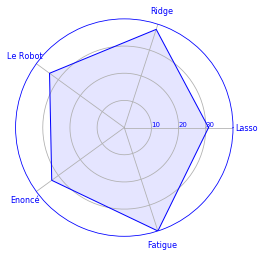

In [224]:
from math import pi

plt.rc('axes',edgecolor='b')

# Set data
df = pd.DataFrame({
'group': ['A','B','C','D'],
'Lasso': [31, 1.5, 30, 4],
'Ridge': [38, 10, 9, 34],
'Le Robot': [34, 39, 23, 24],
'Enoncé': [33, 31, 33, 14],
'Fatigue': [40, 15, 32, 14]
})

# number of variable
categories=list(df)[1:]
N = len(categories)
 
# We are going to plot the first line of the data frame.
# But we need to repeat the first value to close the circular graph:
values=df.loc[0].drop('group').values.flatten().tolist()
values += values[:1]
values
 
# What will be the angle of each axis in the plot? (we divide the plot / number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

print("Sources de problèmes sur ce TP : ")

# Initialise the spider plot
ax = plt.subplot(111, polar=True)

# Draw one axe per variable + add labels labels yet
plt.xticks(angles[:-1], categories, color="blue", size=8)
 
# Draw ylabels
ax.set_rlabel_position(0)
plt.yticks([10,20,30], ["10","20","30"], color="blue", size=7)
plt.ylim(0,40)
 
# Plot data
ax.plot(angles, values, linewidth=1, linestyle='solid', color="blue")
 
# Fill area
ax.fill(angles, values, 'b', alpha=0.1)
plt.show()